In [1]:
import plotly.express as px
import geopandas as gpd
import pandas as pd 
import nbformat

In [2]:
import pandas as pd 
accoglienza_csv = pd.read_csv("https://raw.githubusercontent.com/ondata/liberiamoli-tutti/refs/heads/main/sbarchi-migranti/dati/accoglienza.csv")
accoglienza_csv.head()
accoglienza_csv_20190930 = accoglienza_csv[accoglienza_csv["Data_Report"] == "2019-09-30"]
accoglienza_csv_20190930 = accoglienza_csv_20190930.rename(columns={"CodiceRegione": "COD_REG", "DenominazioneRegione": "DEN_REG"})
accoglienza_csv_20190930
accoglienza_csv = accoglienza_csv.rename(columns={"CodiceRegione": "COD_REG", "DenominazioneRegione": "DEN_REG"})

In [3]:
from pyogrio import list_layers
print(list_layers("/home/enrique/github/geospatialcourse2025/data/istat_administrative_units_generalized_2025.gpkg"))

regions = gpd.read_file("/home/enrique/github/geospatialcourse2025/data/istat_administrative_units_generalized_2025.gpkg", layer="regions")
regions

macroregions = gpd.read_file("/home/enrique/github/geospatialcourse2025/data/istat_administrative_units_generalized_2025.gpkg", layer="macroregions")
macroregions

[['municipalities' 'MultiPolygon']
 ['provinces' 'MultiPolygon']
 ['regions' 'MultiPolygon']
 ['macroregions' 'MultiPolygon']]


,COD_RIP,DEN_RIP,geometry
0,1,Nord-ovest,"MULTIPOLYGON (((568231.969 4874857.994, 568233..."
1,2,Nord-est,"MULTIPOLYGON (((618335.21 4893983.16, 618329.9..."
2,3,Centro,"MULTIPOLYGON (((876027.96 4525207.198, 876222...."
3,4,Sud,"MULTIPOLYGON (((1083304.797 4416671.21, 108333..."
4,5,Isole,"MULTIPOLYGON (((822779.053 3935557.494, 822909..."


In [4]:
accoglienza_20190930_geodf = regions.merge(accoglienza_csv_20190930, on="COD_REG").set_index("COD_REG")
accoglienza_20190930_geodf

,COD_RIP,DEN_REG_x,geometry,Regione,Data_Report,Migranti presenti negli hot spot,Migranti presenti nei centri di accoglienza,Migranti presenti nei centri SIPROIMI,Migranti presenti nei centri SAI,DEN_REG_y
COD_REG,,,,,,,,,,
1,1,Piemonte,"MULTIPOLYGON (((457423.465 5145719.795, 457503...",Piemonte,2019-09-30,NaN,7198,1693.0,NaN,Piemonte
2,1,Valle d'Aosta,"MULTIPOLYGON (((389617.651 5093644.156, 389835...",Valle d'Aosta,2019-09-30,NaN,161,25.0,NaN,Valle d'Aosta/Vallée d'Aoste
3,1,Lombardia,"MULTIPOLYGON (((485366.17 4984899.483, 485306....",Lombardia,2019-09-30,NaN,11701,2105.0,NaN,Lombardia
4,2,Trentino-Alto Adige,"MULTIPOLYGON (((743539.748 5219742.292, 744116...",Trentino-Alto Adige,2019-09-30,NaN,1929,357.0,NaN,Trentino-Alto Adige/Südtirol
5,2,Veneto,"MULTIPOLYGON (((768720.205 5175392.996, 769182...",Veneto,2019-09-30,NaN,6088,678.0,NaN,Veneto
6,2,Friuli-Venezia Giulia,"MULTIPOLYGON (((870657.845 5067641.461, 870660...",Friuli-Venezia Giulia,2019-09-30,NaN,2732,356.0,NaN,Friuli-Venezia Giulia
7,1,Liguria,"MULTIPOLYGON (((568231.969 4874857.994, 568233...",Liguria,2019-09-30,NaN,3200,718.0,NaN,Liguria
8,2,Emilia-Romagna,"MULTIPOLYGON (((618335.21 4893983.16, 618329.9...",Emilia-Romagna,2019-09-30,NaN,7514,2250.0,NaN,Emilia-Romagna
9,3,Toscana,"MULTIPOLYGON (((674015.083 4681177.003, 674247...",Toscana,2019-09-30,NaN,5742,1283.0,NaN,Toscana


In [6]:
type(accoglienza_20190930_geodf.geometry)

geopandas.geoseries.GeoSeries

<Axes: >

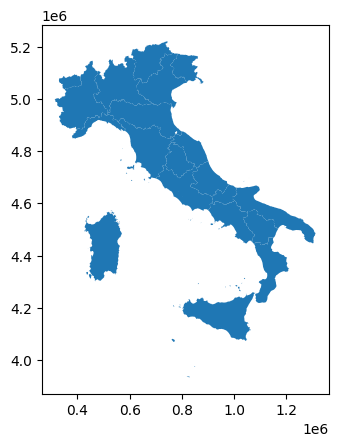

In [7]:
accoglienza_20190930_geodf.plot()

In [8]:
accoglienza_20190930_geodf.crs
accoglienza_20190930_geodf = accoglienza_20190930_geodf.to_crs(epsg=4326)


In [9]:

fig_accoglienza = px.choropleth_map(accoglienza_20190930_geodf,
                           geojson=accoglienza_20190930_geodf.geometry,
                           locations=accoglienza_20190930_geodf.index,
                           color="Migranti presenti nei centri di accoglienza",
                           center={"lat": 41.9028, "lon": 12.4964},
                           #map_style="mercator",
                           zoom=4.5)
fig_accoglienza.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})

fig_accoglienza.show()

In [5]:
accoglienza_geodf = regions.merge(accoglienza_csv, on="COD_REG").set_index("COD_REG")
accoglienza_geodf

,COD_RIP,DEN_REG_x,geometry,Regione,Data_Report,Migranti presenti negli hot spot,Migranti presenti nei centri di accoglienza,Migranti presenti nei centri SIPROIMI,Migranti presenti nei centri SAI,DEN_REG_y
COD_REG,,,,,,,,,,
1,1,Piemonte,"MULTIPOLYGON (((457423.465 5145719.795, 457503...",Piemonte,2019-09-30,NaN,7198,1693.0,NaN,Piemonte
1,1,Piemonte,"MULTIPOLYGON (((457423.465 5145719.795, 457503...",Piemonte,2019-10-15,NaN,7134,1748.0,NaN,Piemonte
1,1,Piemonte,"MULTIPOLYGON (((457423.465 5145719.795, 457503...",Piemonte,2019-10-31,NaN,7110,1748.0,NaN,Piemonte
1,1,Piemonte,"MULTIPOLYGON (((457423.465 5145719.795, 457503...",Piemonte,2019-11-15,NaN,7000,1739.0,NaN,Piemonte
1,1,Piemonte,"MULTIPOLYGON (((457423.465 5145719.795, 457503...",Piemonte,2019-11-30,NaN,6875,1739.0,NaN,Piemonte
...,...,...,...,...,...,...,...,...,...,...
20,5,Sardegna,"MULTIPOLYGON (((448847.899 4301757.5, 448902.8...",Sardegna,2025-07-15,NaN,2373,NaN,288.0,Sardegna
20,5,Sardegna,"MULTIPOLYGON (((448847.899 4301757.5, 448902.8...",Sardegna,2025-07-31,NaN,2446,NaN,288.0,Sardegna
20,5,Sardegna,"MULTIPOLYGON (((448847.899 4301757.5, 448902.8...",Sardegna,2025-08-15,NaN,2558,NaN,284.0,Sardegna


In [6]:
accoglienza_geodf.crs
accoglienza_geodf = accoglienza_geodf.to_crs(epsg=4326)


# Utilizzo di Folium per cloropleth map con più layer e timeslider

In [12]:
accoglienza_20190930_geodf.head()

,COD_RIP,DEN_REG_x,geometry,Regione,Data_Report,Migranti presenti negli hot spot,Migranti presenti nei centri di accoglienza,Migranti presenti nei centri SIPROIMI,Migranti presenti nei centri SAI,DEN_REG_y
COD_REG,,,,,,,,,,
1,1,Piemonte,"MULTIPOLYGON (((8.44549 46.46371, 8.44654 46.4...",Piemonte,2019-09-30,NaN,7198,1693.0,NaN,Piemonte
2,1,Valle d'Aosta,"MULTIPOLYGON (((7.57478 45.98748, 7.57762 45.9...",Valle d'Aosta,2019-09-30,NaN,161,25.0,NaN,Valle d'Aosta/Vallée d'Aoste
3,1,Lombardia,"MULTIPOLYGON (((8.81427 45.01739, 8.81351 45.0...",Lombardia,2019-09-30,NaN,11701,2105.0,NaN,Lombardia
4,2,Trentino-Alto Adige,"MULTIPOLYGON (((12.20868 47.08622, 12.21624 47...",Trentino-Alto Adige,2019-09-30,NaN,1929,357.0,NaN,Trentino-Alto Adige/Südtirol
5,2,Veneto,"MULTIPOLYGON (((12.51368 46.67811, 12.51964 46...",Veneto,2019-09-30,NaN,6088,678.0,NaN,Veneto


# TEST FOLIUM

In [28]:
# --> questa funziona!!!
import folium
import branca.colormap as cm
import json

# Prepara mappa
m = folium.Map(location=[41.9, 12.5], zoom_start=5, tiles="CartoDB positron")

# Prepara GeoJSON
gdf = accoglienza_20190930_geodf.to_crs(epsg=4326)
geojson = json.loads(gdf.to_json())

# Funzione per creare colormap
def make_colormap(series, palette):
    if palette == 'pubu':
        return cm.linear.PuBu_05.scale(series.min(), series.max())
    else:
        return cm.linear.YlOrRd_09.scale(series.min(), series.max()) 

# Funzione helper per aggiungere un layer
def add_geojson_layer(m, gdf, geojson, column, name, palette='default'):
    
    gdf[column] = pd.to_numeric(gdf[column], errors="coerce")
    
    gdf[column] = gdf[column].fillna(0)

    fg = folium.FeatureGroup(name=name)

    colormap = make_colormap(gdf[column].astype(float), palette=palette)

    def style_fn(feature):
        val = feature['properties'][column]
        if val is None:
            return {"fillColor": "#d3d3d3", "color": "black", "weight": 0.5, "fillOpacity": 0.5}
        return {
            "fillColor": colormap(val),
            "color": "black",
            "weight": 0.5,
            "fillOpacity": 0.8
        }

    gj = folium.GeoJson(
        geojson,
        style_function=style_fn
    )

    # Tooltip come child del GeoJson
    folium.GeoJsonTooltip(
        fields=["DEN_REG_x", column],
        aliases=["Regione:", name],
        sticky=True
    ).add_to(gj)

    gj.add_to(fg)
    fg.add_to(m)

    # Aggiungi colormap
    colormap.caption = name
    colormap.add_to(m)

# Aggiungi tre layer
add_geojson_layer(m, gdf, geojson, "Migranti presenti nei centri di accoglienza", "Accoglienza")
add_geojson_layer(m, gdf, geojson, "Migranti presenti nei centri SIPROIMI", "SIPROIMI", "pubu")
add_geojson_layer(m, gdf, geojson, "Migranti presenti nei centri SAI", "SAI")

# Layer control
folium.LayerControl(collapsed=False).add_to(m)

m


In [29]:
m.save('new_map_folium_accoglienza_test.html') # --> QUESTA FUNZIONA!!!

In [31]:
accoglienza_geodf

,COD_RIP,DEN_REG_x,geometry,Regione,Data_Report,Migranti presenti negli hot spot,Migranti presenti nei centri di accoglienza,Migranti presenti nei centri SIPROIMI,Migranti presenti nei centri SAI,DEN_REG_y
COD_REG,,,,,,,,,,
1,1,Piemonte,"MULTIPOLYGON (((8.44549 46.46371, 8.44654 46.4...",Piemonte,2019-09-30,NaN,7198,1693.0,NaN,Piemonte
1,1,Piemonte,"MULTIPOLYGON (((8.44549 46.46371, 8.44654 46.4...",Piemonte,2019-10-15,NaN,7134,1748.0,NaN,Piemonte
1,1,Piemonte,"MULTIPOLYGON (((8.44549 46.46371, 8.44654 46.4...",Piemonte,2019-10-31,NaN,7110,1748.0,NaN,Piemonte
1,1,Piemonte,"MULTIPOLYGON (((8.44549 46.46371, 8.44654 46.4...",Piemonte,2019-11-15,NaN,7000,1739.0,NaN,Piemonte
1,1,Piemonte,"MULTIPOLYGON (((8.44549 46.46371, 8.44654 46.4...",Piemonte,2019-11-30,NaN,6875,1739.0,NaN,Piemonte
...,...,...,...,...,...,...,...,...,...,...
20,5,Sardegna,"MULTIPOLYGON (((8.41041 38.86317, 8.41104 38.8...",Sardegna,2025-07-15,NaN,2373,NaN,288.0,Sardegna
20,5,Sardegna,"MULTIPOLYGON (((8.41041 38.86317, 8.41104 38.8...",Sardegna,2025-07-31,NaN,2446,NaN,288.0,Sardegna
20,5,Sardegna,"MULTIPOLYGON (((8.41041 38.86317, 8.41104 38.8...",Sardegna,2025-08-15,NaN,2558,NaN,284.0,Sardegna


# TESTWIDE

In [ ]:
# FORMTO WIDE

In [85]:
import folium
import json
import pandas as pd
import matplotlib.cm as mpl_cm
import matplotlib.colors as mpl_colors
from folium.plugins import TimeSliderChoropleth
import branca.colormap as cm


In [86]:
gdf = accoglienza_geodf.copy()

# ID regione → usa COD_REG (indice)
gdf["region_id"] = gdf.index.astype(str)

# Date
gdf["Data_Report"] = pd.to_datetime(gdf["Data_Report"], format="%Y-%m-%d")
gdf["date_str"] = gdf["Data_Report"].dt.strftime("%Y-%m-%d")

cols = [
    "Migranti presenti nei centri di accoglienza",
    "Migranti presenti nei centri SIPROIMI",
    "Migranti presenti nei centri SAI"
]

for c in cols:
    gdf[c] = pd.to_numeric(gdf[c], errors="coerce").fillna(0)

gdf = gdf.to_crs(epsg=4326)


In [87]:
gdf = gdf.copy()
gdf["id"] = gdf["region_id"].astype(str)   # oppure Regione se è unica
# gdf = gdf.set_index("id")


geojson = json.loads(
    gdf.drop_duplicates("region_id")[["id","region_id", "DEN_REG_x", "geometry"]]
    .set_index("region_id")
    .to_json()
)


In [88]:
geojson

{'type': 'FeatureCollection',
 'features': [{'id': '1',
   'type': 'Feature',
   'properties': {'id': '1', 'DEN_REG_x': 'Piemonte'},
   'geometry': {'type': 'MultiPolygon',
    'coordinates': [[[[8.445494362290935, 46.46370534857806],
       [8.446540726578757, 46.46347681338918],
       [8.447741257869769, 46.46303223988365],
       [8.448660245255386, 46.462515104385886],
       [8.449759645513712, 46.46176403000261],
       [8.452368025829527, 46.45906970589765],
       [8.462417849138731, 46.44827987286964],
       [8.465210209807053, 46.44512512158974],
       [8.46542583614727, 46.44476653834618],
       [8.46582359416236, 46.44349045303191],
       [8.465881263533923, 46.44290438084507],
       [8.465500878027433, 46.44190461839772],
       [8.464950977616528, 46.44089410075164],
       [8.464398012417915, 46.4401985380956],
       [8.464105587396856, 46.43992695951671],
       [8.46359880577136, 46.43945754325461],
       [8.463244230745003, 46.439276505483996],
       [8.46236

In [89]:
def value_to_color(val, vmin, vmax, cmap_name):
    norm = mpl_colors.Normalize(vmin=vmin, vmax=vmax)
    cmap = mpl_cm.get_cmap(cmap_name)
    return mpl_colors.to_hex(cmap(norm(val)))


In [90]:
def create_styledict_wide(gdf, value_column, cmap_name):
    """
    Crea uno styledict per TimeSliderChoropleth usando timestamp reali
    dalla colonna 'Data_Report' del GeoDataFrame.
    
    gdf: GeoDataFrame con colonne
        - 'region_id' (ID regione)
        - value_column (valore da colorare)
        - 'Data_Report' (datetime)
    """
    styledict = {}

    # 1️⃣ range valori
    vmin = gdf[value_column].min()
    vmax = gdf[value_column].max()

    # 2️⃣ costruzione styledict
    for region_id, grp in gdf.groupby("region_id"):
        rid = str(region_id)  # ID come stringa
        styledict[rid] = {}

        for _, row in grp.iterrows():
            val = row[value_column]
            if pd.isna(val):
                continue

            # timestamp in millisecondi (per TimeSliderChoropleth)
            # ts = int(row["Data_Report"].timestamp() * 1000)
            ts = str(int(row["Data_Report"].value // 10**6))[:10]

            color = value_to_color(
                val,
                vmin,
                vmax,
                cmap_name
            )

            styledict[rid][ts] = {
                # "color": "black",
                # "weight": 0.5,
                "color": color,
                "opacity": 0.8
            }

    return styledict


In [96]:
m = folium.Map(
    location=[41.9, 12.5],
    zoom_start=5,
    tiles="CartoDB positron"
)


In [92]:
print(gdf["date_str"].unique()[:10])
print(type(gdf["date_str"].iloc[0]))


['2019-09-30' '2019-10-15' '2019-10-31' '2019-11-15' '2019-11-30'
 '2019-12-15' '2019-12-31' '2020-01-15' '2020-01-31' '2020-02-15']
<class 'str'>


In [97]:
layers = [
    ("Migranti presenti negli hot spot", "Hot Spot", "YlOrRd"),
    ("Migranti presenti nei centri di accoglienza", "Accoglienza", "RdPu"),
    ("Migranti presenti nei centri SIPROIMI", "SIPROIMI", "PuBuGn"),
    ("Migranti presenti nei centri SAI", "SAI", "YlGn"),
]
with open("debug_geojson.json", "w", encoding="utf-8") as f:
    json.dump(geojson, f, indent=2, ensure_ascii=False)

for col, name, cmap in layers:
    styledict = create_styledict_wide(gdf, col, cmap)
    print(styledict)
    fg = folium.FeatureGroup(name=name)
    with open(f"debug_styledict_{name}.json", "w", encoding="utf-8") as f:
        json.dump(styledict, f, indent=2)

    TimeSliderChoropleth(
        data=geojson,
        styledict=styledict,
        init_timestamp=0
    ).add_to(fg)
    # tsc.add_child()
    # Tooltip come child del GeoJson
    # folium.GeoJsonTooltip(
    #     fields=["DEN_REG_x", col],
    #     aliases=["Regione:", name],
    #     sticky=True
    # ).add_to(fg)
    print(fg.to_json())
    
    #gj.add_to(fg)
    

    fg.add_to(m)

# Colormaps
colormap = cm.linear.YlOrRd_09.scale(
    gdf["Migranti presenti negli hot spot"].min(),
    gdf["Migranti presenti negli hot spot"].max()
)
colormap.caption = "Migranti presenti negli hot spot"
colormap.add_to(m)

colormap = cm.linear.RdPu_09.scale(
    gdf["Migranti presenti nei centri di accoglienza"].min(),
    gdf["Migranti presenti nei centri di accoglienza"].max()
)
colormap.caption = "Migranti presenti nei centri di accoglienza"
colormap.add_to(m)

colormap = cm.linear.PuBuGn_09.scale(
    gdf["Migranti presenti nei centri SIPROIMI"].min(),
    gdf["Migranti presenti nei centri SIPROIMI"].max()
)
colormap.caption = "Migranti presenti nei centri SIPROIMI"
colormap.add_to(m)

colormap = cm.linear.YlGn_09.scale(
    gdf["Migranti presenti nei centri SAI"].min(),
    gdf["Migranti presenti nei centri SAI"].max()
)
colormap.caption = "Migranti presenti nei centri SAI"
colormap.add_to(m)

/tmp/ipykernel_650/2286996698.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/tmp/ipykernel_650/2286996698.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/tmp/ipykernel_650/2286996698.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/tmp/ipykernel_650/2286996698.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap

{'1': {}, '10': {}, '11': {}, '12': {}, '13': {}, '14': {}, '15': {}, '16': {'1569801600': {'color': '#ffffcc', 'opacity': 0.8}, '1571097600': {'color': '#ffffcc', 'opacity': 0.8}, '1572480000': {'color': '#ffffcc', 'opacity': 0.8}, '1573776000': {'color': '#ffffcc', 'opacity': 0.8}, '1575072000': {'color': '#fffecb', 'opacity': 0.8}, '1576368000': {'color': '#ffffcc', 'opacity': 0.8}, '1577750400': {'color': '#ffffcc', 'opacity': 0.8}, '1579046400': {'color': '#ffffcc', 'opacity': 0.8}, '1580428800': {'color': '#fffcc4', 'opacity': 0.8}, '1581724800': {'color': '#ffffcc', 'opacity': 0.8}, '1582934400': {'color': '#ffffcc', 'opacity': 0.8}, '1584230400': {'color': '#ffffcc', 'opacity': 0.8}, '1585612800': {'color': '#ffffcc', 'opacity': 0.8}, '1586908800': {'color': '#ffffcc', 'opacity': 0.8}, '1588204800': {'color': '#ffffcc', 'opacity': 0.8}, '1589500800': {'color': '#ffffcc', 'opacity': 0.8}, '1590883200': {'color': '#fffcc5', 'opacity': 0.8}, '1592179200': {'color': '#fffdc8', 'opa

/tmp/ipykernel_650/2286996698.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/tmp/ipykernel_650/2286996698.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/tmp/ipykernel_650/2286996698.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/tmp/ipykernel_650/2286996698.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap

{'1': {'1569801600': {'color': '#f873a5', 'opacity': 0.8}, '1571097600': {'color': '#f875a6', 'opacity': 0.8}, '1572480000': {'color': '#f875a6', 'opacity': 0.8}, '1573776000': {'color': '#f878a7', 'opacity': 0.8}, '1575072000': {'color': '#f87ca8', 'opacity': 0.8}, '1576368000': {'color': '#f87fa9', 'opacity': 0.8}, '1577750400': {'color': '#f881aa', 'opacity': 0.8}, '1579046400': {'color': '#f883ab', 'opacity': 0.8}, '1580428800': {'color': '#f984ab', 'opacity': 0.8}, '1581724800': {'color': '#f984ab', 'opacity': 0.8}, '1582934400': {'color': '#f988ad', 'opacity': 0.8}, '1584230400': {'color': '#f98bae', 'opacity': 0.8}, '1585612800': {'color': '#f98bae', 'opacity': 0.8}, '1586908800': {'color': '#f98dae', 'opacity': 0.8}, '1588204800': {'color': '#f98dae', 'opacity': 0.8}, '1589500800': {'color': '#f98dae', 'opacity': 0.8}, '1590883200': {'color': '#f98faf', 'opacity': 0.8}, '1592179200': {'color': '#f991b0', 'opacity': 0.8}, '1593475200': {'color': '#f992b0', 'opacity': 0.8}, '1594

/tmp/ipykernel_650/2286996698.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/tmp/ipykernel_650/2286996698.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/tmp/ipykernel_650/2286996698.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/tmp/ipykernel_650/2286996698.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap

{'1': {'1569801600': {'color': '#86b3d5', 'opacity': 0.8}, '1571097600': {'color': '#7eb0d3', 'opacity': 0.8}, '1572480000': {'color': '#7eb0d3', 'opacity': 0.8}, '1573776000': {'color': '#80b1d4', 'opacity': 0.8}, '1575072000': {'color': '#80b1d4', 'opacity': 0.8}, '1576368000': {'color': '#86b3d5', 'opacity': 0.8}, '1577750400': {'color': '#86b3d5', 'opacity': 0.8}, '1579046400': {'color': '#82b1d4', 'opacity': 0.8}, '1580428800': {'color': '#82b1d4', 'opacity': 0.8}, '1581724800': {'color': '#82b1d4', 'opacity': 0.8}, '1582934400': {'color': '#82b1d4', 'opacity': 0.8}, '1584230400': {'color': '#86b3d5', 'opacity': 0.8}, '1585612800': {'color': '#86b3d5', 'opacity': 0.8}, '1586908800': {'color': '#82b1d4', 'opacity': 0.8}, '1588204800': {'color': '#82b1d4', 'opacity': 0.8}, '1589500800': {'color': '#90b6d7', 'opacity': 0.8}, '1590883200': {'color': '#90b6d7', 'opacity': 0.8}, '1592179200': {'color': '#8eb5d6', 'opacity': 0.8}, '1593475200': {'color': '#8eb5d6', 'opacity': 0.8}, '1594

/tmp/ipykernel_650/2286996698.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/tmp/ipykernel_650/2286996698.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/tmp/ipykernel_650/2286996698.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/tmp/ipykernel_650/2286996698.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap

{'1': {'1569801600': {'color': '#ffffe5', 'opacity': 0.8}, '1571097600': {'color': '#ffffe5', 'opacity': 0.8}, '1572480000': {'color': '#ffffe5', 'opacity': 0.8}, '1573776000': {'color': '#ffffe5', 'opacity': 0.8}, '1575072000': {'color': '#ffffe5', 'opacity': 0.8}, '1576368000': {'color': '#ffffe5', 'opacity': 0.8}, '1577750400': {'color': '#ffffe5', 'opacity': 0.8}, '1579046400': {'color': '#ffffe5', 'opacity': 0.8}, '1580428800': {'color': '#ffffe5', 'opacity': 0.8}, '1581724800': {'color': '#ffffe5', 'opacity': 0.8}, '1582934400': {'color': '#ffffe5', 'opacity': 0.8}, '1584230400': {'color': '#ffffe5', 'opacity': 0.8}, '1585612800': {'color': '#ffffe5', 'opacity': 0.8}, '1586908800': {'color': '#ffffe5', 'opacity': 0.8}, '1588204800': {'color': '#ffffe5', 'opacity': 0.8}, '1589500800': {'color': '#ffffe5', 'opacity': 0.8}, '1590883200': {'color': '#ffffe5', 'opacity': 0.8}, '1592179200': {'color': '#ffffe5', 'opacity': 0.8}, '1593475200': {'color': '#ffffe5', 'opacity': 0.8}, '1594

/tmp/ipykernel_650/2286996698.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



In [98]:
folium.LayerControl(collapsed=False).add_to(m)


In [100]:
m.save('map_liberiamoli_tutti_accoglienza.html') # DA SISTEMARE!!!!!!!!!!!!!

# FINE - TEST WIDE FUNZIONA

In [108]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots


In [103]:
accoglienza_geodf[['Regione', 'Data_Report', 'Migranti presenti negli hot spot']]

,Regione,Data_Report,Migranti presenti negli hot spot
COD_REG,,,
1,Piemonte,2019-09-30,NaN
1,Piemonte,2019-10-15,NaN
1,Piemonte,2019-10-31,NaN
1,Piemonte,2019-11-15,NaN
1,Piemonte,2019-11-30,NaN
...,...,...,...
20,Sardegna,2025-07-15,NaN
20,Sardegna,2025-07-31,NaN
20,Sardegna,2025-08-15,NaN


In [104]:
pivot = accoglienza_geodf.pivot(
    index="Data_Report",
    columns="Regione",
    values="Migranti presenti negli hot spot"
)


In [105]:
pivot

Regione,Abruzzo,Basilicata,Calabria,Campania,Emilia-Romagna,Friuli-Venezia Giulia,Lazio,Liguria,Lombardia,Marche,Molise,Piemonte,Puglia,Sardegna,Sicilia,Toscana,Trentino-Alto Adige,Umbria,Valle d'Aosta,Veneto
Data_Report,,,,,,,,,,,,,,,,,,,,
2019-09-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,487.0,NaN,NaN,NaN,NaN,NaN
2019-10-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,391.0,NaN,NaN,NaN,NaN,NaN
2019-10-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,350.0,NaN,NaN,NaN,NaN,NaN
2019-11-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,62.0,NaN,NaN,NaN,NaN,NaN
2019-11-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,37.0,NaN,444.0,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-07-15,NaN,NaN,54.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,622.0,NaN,NaN,NaN,NaN,NaN
2025-07-31,NaN,NaN,57.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,325.0,NaN,NaN,NaN,NaN,NaN
2025-08-15,NaN,NaN,25.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,395.0,NaN,NaN,NaN,NaN,NaN


In [106]:
n_bands = 4
regions = pivot.columns.tolist()
time = pivot.index


In [107]:
def horizon_bands(series, n_bands):
    """
    Restituisce una lista di serie, una per banda
    """
    min_val = series.min()
    max_val = series.max()
    band_height = (max_val - min_val) / n_bands

    bands = []
    for i in range(n_bands):
        lower = min_val + i * band_height
        upper = lower + band_height

        band = np.clip(series, lower, upper) - lower
        bands.append(band)

    return bands


In [109]:
fig = make_subplots(
    rows=len(regions),
    cols=1,
    shared_xaxes=True,
    vertical_spacing=0.005,
    subplot_titles=regions
)


In [110]:
for i, region in enumerate(regions, start=1):
    series = pivot[region]

    bands = horizon_bands(series, n_bands)

    for j, band in enumerate(bands):
        fig.add_trace(
            go.Scatter(
                x=time,
                y=band + j,   # sovrapposizione verticale
                mode="lines",
                line=dict(width=0),
                fill="tozeroy",
                hovertemplate=(
                    f"<b>{region}</b><br>"
                    "Data: %{x}<br>"
                    "Intensità banda: %{y:.2f}<extra></extra>"
                ),
                showlegend=False
            ),
            row=i,
            col=1
        )


In [111]:
fig.update_layout(
    height=120 * len(regions),
    title="Horizon Chart – Immigrati nei centri di accoglienza (pattern normalizzati)",
    hovermode="x unified",
    template="plotly_white"
)

fig.update_yaxes(visible=False)

fig.show()


In [112]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_theme(style="whitegrid")


/var/data/python/lib/python3.12/site-packages/seaborn/axisgrid.py:123: UserWarning:

Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.



ValueError: cannot reindex on an axis with duplicate labels

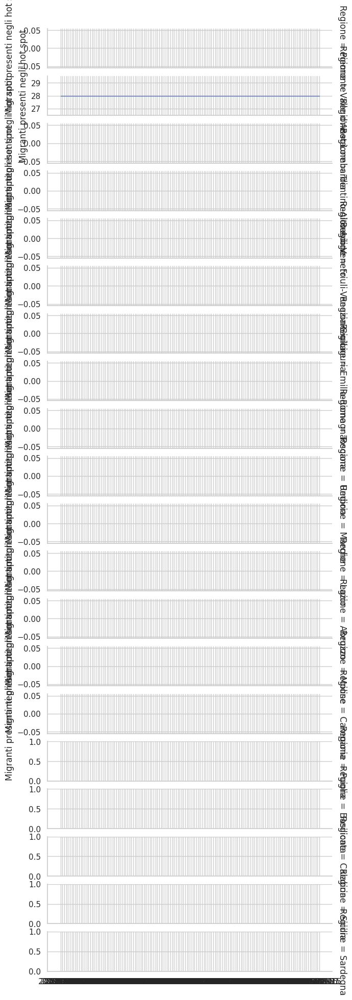

In [114]:
g = sns.FacetGrid(
    accoglienza_geodf,
    row="Regione",
    height=1.2,
    aspect=6,
    sharey=False,
    margin_titles=True
)

g.map_dataframe(
    sns.lineplot,
    x="Data_Report",
    y="Migranti presenti negli hot spot",
    linewidth=1
)

g.set_axis_labels("Data", "Immigrati")
g.set_titles(row_template="{row_name}")
g.tight_layout()

plt.show()


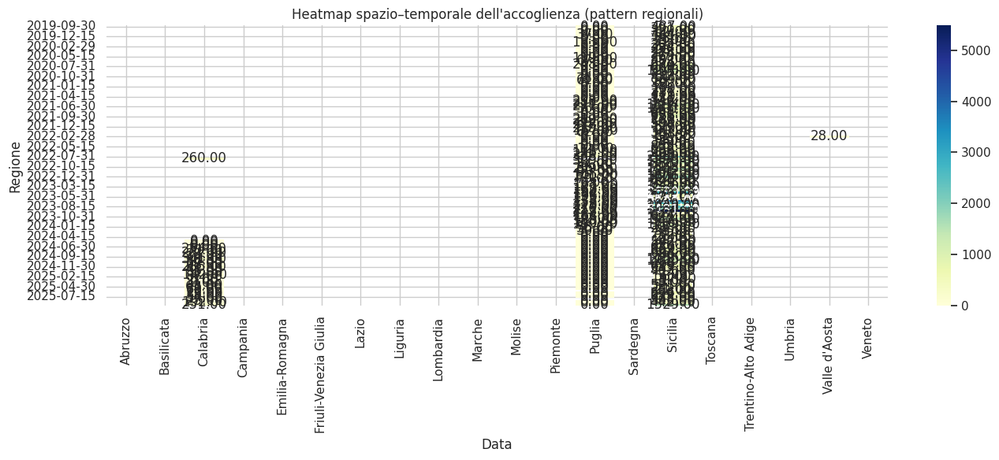

In [116]:
plt.figure(figsize=(14, 6))

# sns.heatmap(
#     pivot,
#     cmap="viridis",
#     cbar_kws={"label": "Valore normalizzato"},
#     linewidths=0
# )

sns.heatmap(pivot, cmap="YlGnBu", annot=True, fmt=".2f")

plt.title("Heatmap spazio–temporale dell'accoglienza (pattern regionali)")
plt.xlabel("Data")
plt.ylabel("Regione")
plt.tight_layout()
plt.show()


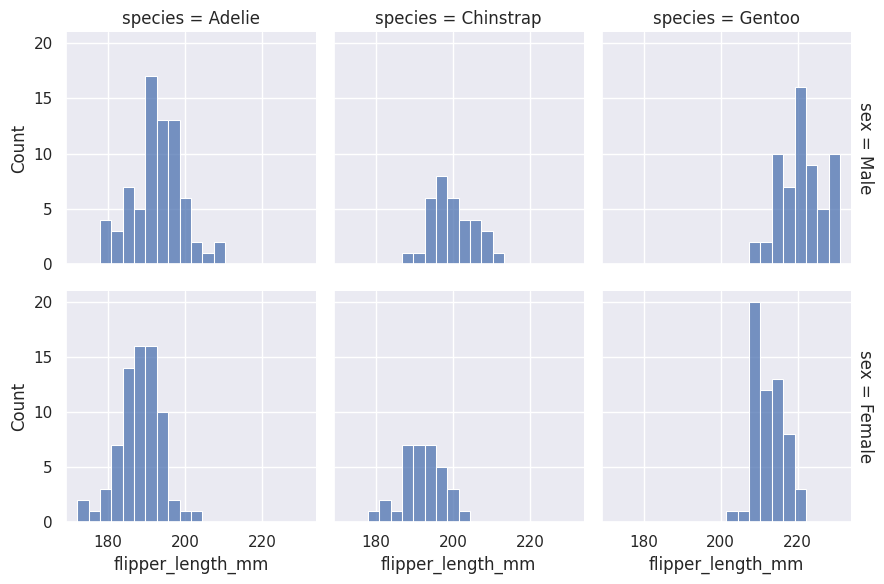

In [117]:
import seaborn as sns

sns.set_theme(style="darkgrid")
df = sns.load_dataset("penguins")
sns.displot(
    df, x="flipper_length_mm", col="species", row="sex",
    binwidth=3, height=3, facet_kws=dict(margin_titles=True),
)

In [118]:
df.head()

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,Male
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,Female
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,Female
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,Female


In [26]:
accoglienza_geodf['Data_Report'] = pd.to_datetime(accoglienza_geodf['Data_Report'])


In [27]:
import datetime

# governi come tuple (inizio, fine)
governi = {
    "Meloni": (pd.Timestamp("2022-10-22"), pd.Timestamp("2100-01-01")),  # fine futura
    "Draghi": (pd.Timestamp("2021-02-13"), pd.Timestamp("2022-10-22")),
    "Conte 2": (pd.Timestamp("2019-09-05"), pd.Timestamp("2021-02-13")),
    "Conte 1": (pd.Timestamp("2018-06-01"), pd.Timestamp("2019-09-05"))
}


In [ ]:
def assegna_governo(data):
    for governo, (start, end) in governi.items():
        if start <= data < end:
            return governo
    return "Other"  # per date fuori range


In [ ]:
accoglienza_geodf['Government'] = accoglienza_geodf['Data_Report'].apply(assegna_governo)


In [ ]:
accoglienza_geodf['Government'].unique()

array(['Conte 2', 'Draghi', 'Meloni'], dtype=object)

In [31]:
accoglienza_geodf[accoglienza_geodf['Regione'] == 'Lombardia']

,COD_RIP,DEN_REG_x,geometry,Regione,Data_Report,Migranti presenti negli hot spot,Migranti presenti nei centri di accoglienza,Migranti presenti nei centri SIPROIMI,Migranti presenti nei centri SAI,DEN_REG_y,Governo
COD_REG,,,,,,,,,,,
3,1,Lombardia,"MULTIPOLYGON (((8.81427 45.01739, 8.81351 45.0...",Lombardia,2019-09-30,NaN,11701,2105.0,NaN,Lombardia,Conte 2
3,1,Lombardia,"MULTIPOLYGON (((8.81427 45.01739, 8.81351 45.0...",Lombardia,2019-10-15,NaN,11556,2108.0,NaN,Lombardia,Conte 2
3,1,Lombardia,"MULTIPOLYGON (((8.81427 45.01739, 8.81351 45.0...",Lombardia,2019-10-31,NaN,11404,2108.0,NaN,Lombardia,Conte 2
3,1,Lombardia,"MULTIPOLYGON (((8.81427 45.01739, 8.81351 45.0...",Lombardia,2019-11-15,NaN,11280,2081.0,NaN,Lombardia,Conte 2
3,1,Lombardia,"MULTIPOLYGON (((8.81427 45.01739, 8.81351 45.0...",Lombardia,2019-11-30,NaN,11178,2081.0,NaN,Lombardia,Conte 2
...,...,...,...,...,...,...,...,...,...,...,...
3,1,Lombardia,"MULTIPOLYGON (((8.81427 45.01739, 8.81351 45.0...",Lombardia,2025-07-15,NaN,14202,NaN,3222.0,Lombardia,Meloni
3,1,Lombardia,"MULTIPOLYGON (((8.81427 45.01739, 8.81351 45.0...",Lombardia,2025-07-31,NaN,14253,NaN,3222.0,Lombardia,Meloni
3,1,Lombardia,"MULTIPOLYGON (((8.81427 45.01739, 8.81351 45.0...",Lombardia,2025-08-15,NaN,14180,NaN,3307.0,Lombardia,Meloni


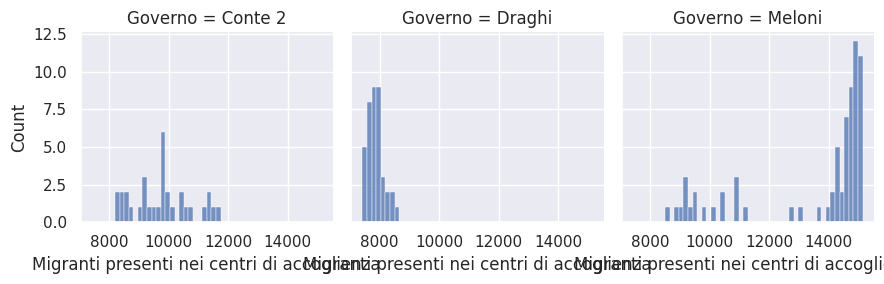

In [ ]:
import seaborn as sns

sns.set_theme(style="darkgrid")
sns.displot(
    accoglienza_geodf[accoglienza_geodf['Regione'] == 'Lombardia'], x="Migranti presenti nei centri di accoglienza", col="Government",
     height=3, bins = 50, facet_kws=dict(margin_titles=True),
)

In [119]:
accoglienza_geodf.head()

,COD_RIP,DEN_REG_x,geometry,Regione,Data_Report,Migranti presenti negli hot spot,Migranti presenti nei centri di accoglienza,Migranti presenti nei centri SIPROIMI,Migranti presenti nei centri SAI,DEN_REG_y
COD_REG,,,,,,,,,,
1,1,Piemonte,"MULTIPOLYGON (((8.44549 46.46371, 8.44654 46.4...",Piemonte,2019-09-30,NaN,7198,1693.0,NaN,Piemonte
1,1,Piemonte,"MULTIPOLYGON (((8.44549 46.46371, 8.44654 46.4...",Piemonte,2019-10-15,NaN,7134,1748.0,NaN,Piemonte
1,1,Piemonte,"MULTIPOLYGON (((8.44549 46.46371, 8.44654 46.4...",Piemonte,2019-10-31,NaN,7110,1748.0,NaN,Piemonte
1,1,Piemonte,"MULTIPOLYGON (((8.44549 46.46371, 8.44654 46.4...",Piemonte,2019-11-15,NaN,7000,1739.0,NaN,Piemonte
1,1,Piemonte,"MULTIPOLYGON (((8.44549 46.46371, 8.44654 46.4...",Piemonte,2019-11-30,NaN,6875,1739.0,NaN,Piemonte


<Axes: xlabel='Data_Report', ylabel='Migranti presenti nei centri di accoglienza'>

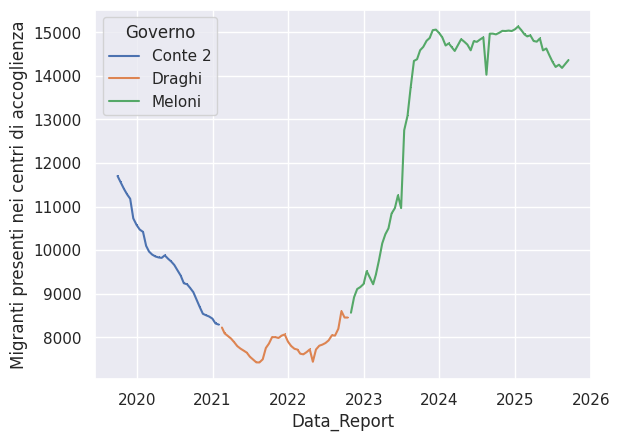

In [ ]:
sns.set_theme(style="darkgrid")

sns.lineplot(
    data=accoglienza_geodf[accoglienza_geodf['Regione'] == 'Lombardia'],
    x='Data_Report',
    y='Migranti presenti nei centri di accoglienza',
    hue='Government',   # colore per i governi
    marker=','
)



NameError: name 'plt' is not defined

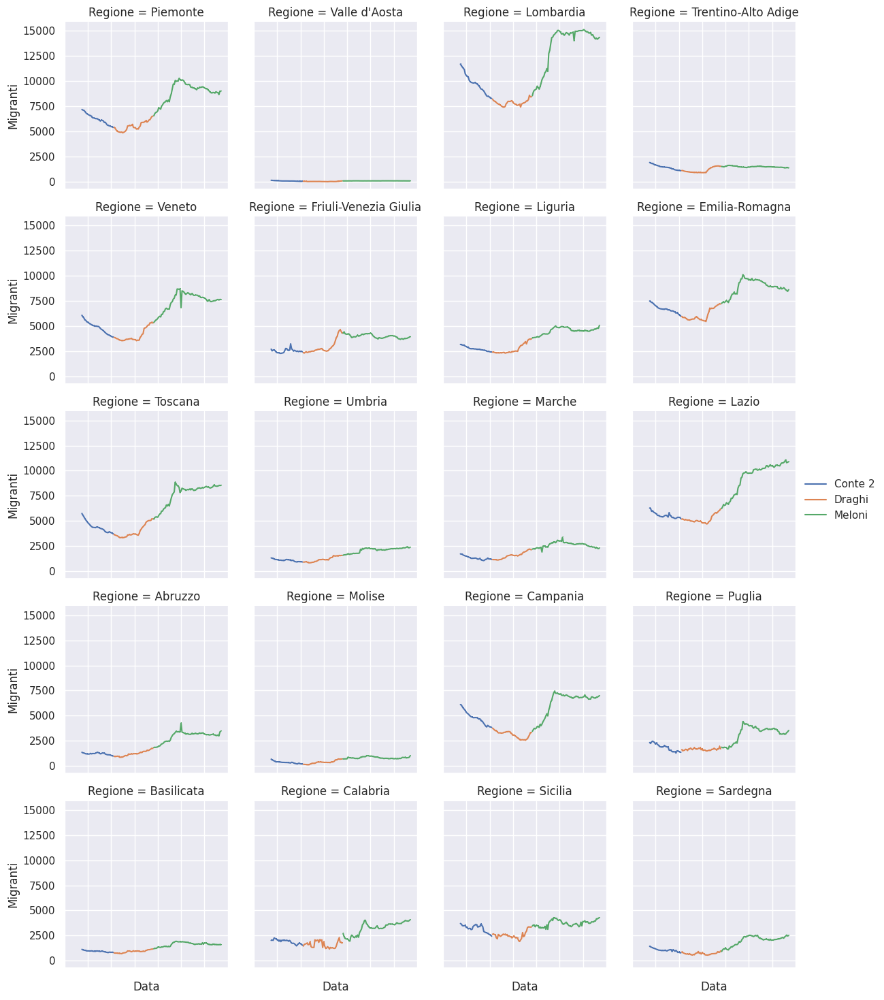

In [ ]:
g = sns.FacetGrid(
    accoglienza_geodf,
    col='Regione',
    col_wrap=4,     # 4 colonne per riga
    height=3,
    sharey=True
)

g.map_dataframe(
    sns.lineplot,
    x='Data_Report',
    y='Migranti presenti nei centri di accoglienza',
    hue='Government',
    marker=','
)

g.set_xticklabels(rotation=45)
g.set_axis_labels("Data", "Migranti")
g.add_legend()
plt.show()


<Axes: xlabel='Data_Report', ylabel='Migranti presenti nei centri di accoglienza'>

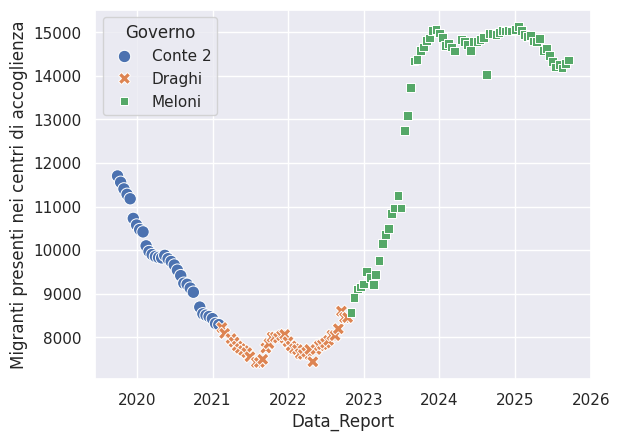

In [ ]:
sns.set_theme(style="darkgrid")

sns.scatterplot(
    data=accoglienza_geodf[accoglienza_geodf['Regione'] == 'Lombardia'],
    x='Data_Report',
    y='Migranti presenti nei centri di accoglienza',
    hue='Government',   # colore per i governi
    style='Government',
    s=80
)



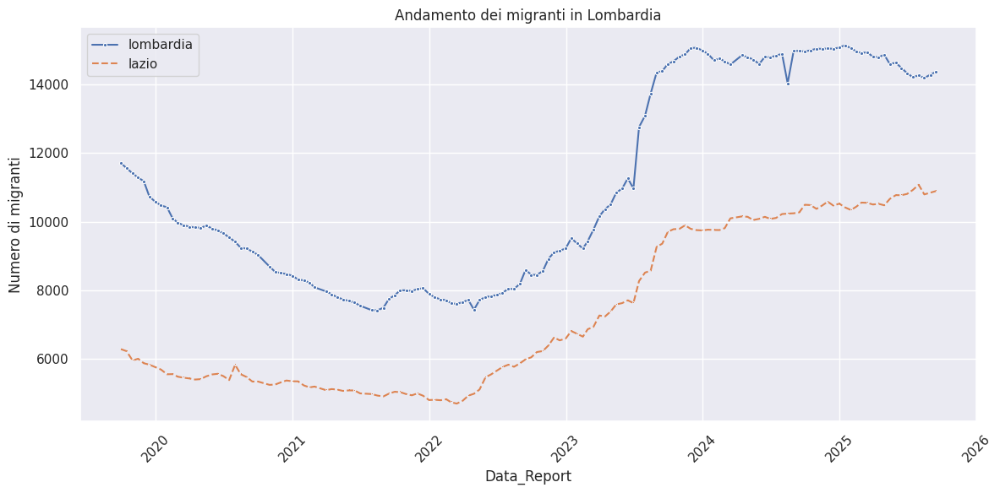

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_theme(style="darkgrid")

plt.figure(figsize=(12, 6))

# Primo lineplot
sns.lineplot(
    data=accoglienza_geodf[accoglienza_geodf['Regione'] == 'Lombardia'],
    x='Data_Report',
    y='Migranti presenti nei centri di accoglienza',
    #hue='Government',
    marker='.',
    label='lombardia'
)

# Secondo lineplot (ad esempio: Immigrati presenti negli hotspot)
sns.lineplot(
    data=accoglienza_geodf[accoglienza_geodf['Regione'] == 'Lazio'],
    x='Data_Report',
    y='Migranti presenti nei centri di accoglienza',
    #hue='Government',      # se vuoi gli stessi colori
    marker=',',
    linestyle='--',
    label='lazio'
)

plt.xticks(rotation=45)
plt.ylabel("Numero di migranti")
plt.title("Andamento dei migranti in Lombardia")
plt.legend()
plt.tight_layout()
plt.show()


ValueError: cannot reindex on an axis with duplicate labels

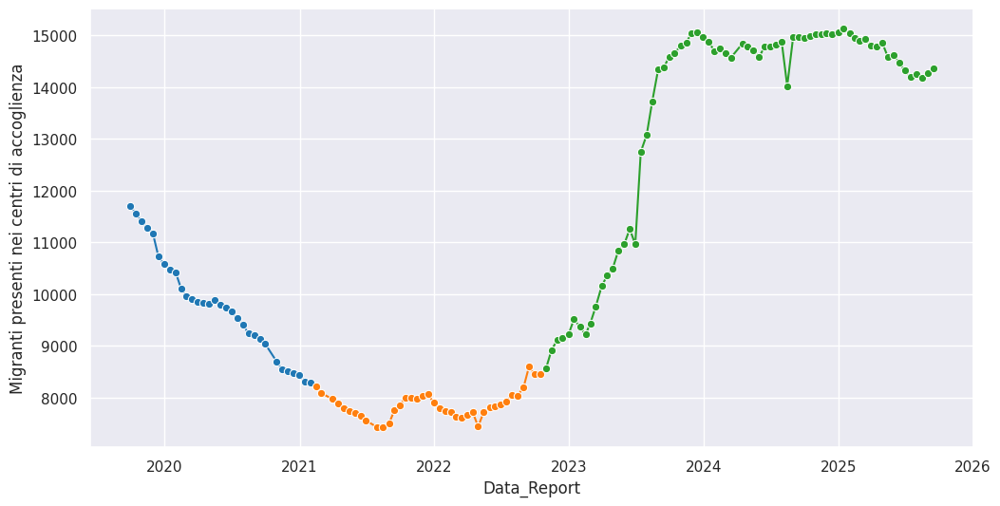

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_theme(style="darkgrid")

df_lombardia = accoglienza_geodf[accoglienza_geodf['Regione'] == 'Lombardia']

plt.figure(figsize=(12,6))

# Primo plot: Centri di accoglienza
sns.lineplot(
    data=df_lombardia,
    x='Data_Report',
    y='Migranti presenti nei centri di accoglienza',
    hue='Government',       # colori per Governo
    marker='o',
    palette='tab10',
    legend=False          # disattiviamo la legenda automatica
)

# Secondo plot: Hotspot
sns.lineplot(
    data=df_lombardia,
    x='Data_Report',
    y='Migranti presenti nei centri SAI',
    hue='Government',       # stesso colore per Governo
    marker='s',
    linestyle='--',
    palette='tab10',
    legend=False
)

plt.xticks(rotation=45)
plt.ylabel("Numero di migranti")
plt.title("Migranti in Lombardia: Centri vs Hotspot")

# Creiamo la legenda manuale
import matplotlib.patches as mpatches
import matplotlib.lines as mlines

# Legenda per le tipologie (curva 1 vs curva 2)
tipo1 = mlines.Line2D([], [], color='black', marker='o', linestyle='-', label='Centri di accoglienza')
tipo2 = mlines.Line2D([], [], color='black', marker='s', linestyle='--', label='Hotspot')

plt.legend(handles=[tipo1, tipo2], title="Tipologia")

plt.tight_layout()
plt.show()


In [51]:
accoglienza_geodf = accoglienza_geodf.fillna(0)


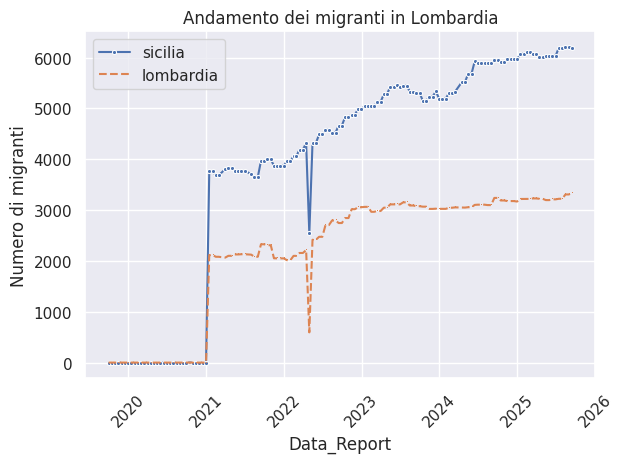

In [ ]:
#Migranti presenti nei centri SAI	
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_theme(style="darkgrid")

#plt.figure(figsize=(12, 6))

# Primo lineplot
sns.lineplot(
    data=accoglienza_geodf[accoglienza_geodf['Regione'] == 'Sicilia'],
    x='Data_Report',
    y='Migranti presenti nei centri SAI',
    #hue='Government',
    marker='.',
    label='sicilia'
)

# Secondo lineplot (ad esempio: Immigrati presenti negli hotspot)
sns.lineplot(
    data=accoglienza_geodf[accoglienza_geodf['Regione'] == 'Lombardia'],
    x='Data_Report',
    y='Migranti presenti nei centri SAI',
    #hue='Government',      # se vuoi gli stessi colori
    marker=',',
    linestyle='--',
    label='lombardia'
)

plt.xticks(rotation=45)
plt.ylabel("Numero di migranti")
plt.title("Migranti presenti nei centri SAI (Lombardia e Sicilia)")
plt.legend()
plt.tight_layout()
plt.show()


# VERIFICA PER MACROREGIONI

In [33]:
macroregions

,COD_RIP,DEN_RIP,geometry
0,1,Nord-ovest,"MULTIPOLYGON (((9.85139 44.0237, 9.8514 44.023..."
1,2,Nord-est,"MULTIPOLYGON (((10.48069 44.18947, 10.48063 44..."
2,3,Centro,"MULTIPOLYGON (((13.45646 40.79178, 13.45866 40..."
3,4,Sud,"MULTIPOLYGON (((15.8009 39.70036, 15.80123 39...."
4,5,Isole,"MULTIPOLYGON (((12.55877 35.51115, 12.5601 35...."


In [34]:
pts = accoglienza_geodf.copy()
pts.geometry = pts.geometry.representative_point()

joined = gpd.sjoin(
    pts,
    macroregions[['DEN_RIP', 'geometry']],
    predicate='within',
    how='left'
)

# gdf_regioni['macroregion'] = joined['macroregion']


In [35]:
type(joined)
joined = joined.rename(columns={'DEN_RIP': 'macroregion'})


In [36]:
joined.head()

,COD_RIP,DEN_REG_x,geometry,Regione,Data_Report,Migranti presenti negli hot spot,Migranti presenti nei centri di accoglienza,Migranti presenti nei centri SIPROIMI,Migranti presenti nei centri SAI,DEN_REG_y,Governo,index_right,macroregion
COD_REG,,,,,,,,,,,,,
1,1,Piemonte,POINT (7.83374 45.26229),Piemonte,2019-09-30,NaN,7198,1693.0,NaN,Piemonte,Conte 2,0,Nord-ovest
1,1,Piemonte,POINT (7.83374 45.26229),Piemonte,2019-10-15,NaN,7134,1748.0,NaN,Piemonte,Conte 2,0,Nord-ovest
1,1,Piemonte,POINT (7.83374 45.26229),Piemonte,2019-10-31,NaN,7110,1748.0,NaN,Piemonte,Conte 2,0,Nord-ovest
1,1,Piemonte,POINT (7.83374 45.26229),Piemonte,2019-11-15,NaN,7000,1739.0,NaN,Piemonte,Conte 2,0,Nord-ovest
1,1,Piemonte,POINT (7.83374 45.26229),Piemonte,2019-11-30,NaN,6875,1739.0,NaN,Piemonte,Conte 2,0,Nord-ovest


In [39]:
accoglienza_geodf[accoglienza_geodf['macroregion'] == 'Sud']

KeyError: 'macroregion'

In [51]:
joined[(joined['macroregion'] == 'Sud') & (joined['Data_Report'] == pd.Timestamp('2025-09-15'))]#['Migranti presenti nei centri di accoglienza'].sum()

,COD_RIP,DEN_REG_x,geometry,Regione,Data_Report,Migranti presenti negli hot spot,Migranti presenti nei centri di accoglienza,Migranti presenti nei centri SIPROIMI,Migranti presenti nei centri SAI,DEN_REG_y,Governo,index_right,macroregion
COD_REG,,,,,,,,,,,,,
13,4,Abruzzo,POINT (13.85202 42.291),Abruzzo,2025-09-15,NaN,3471,NaN,935.0,Abruzzo,Meloni,3,Sud
14,4,Molise,POINT (14.62481 41.71707),Molise,2025-09-15,NaN,1012,NaN,928.0,Molise,Meloni,3,Sud
15,4,Campania,POINT (14.91696 40.7482),Campania,2025-09-15,NaN,6982,NaN,4140.0,Campania,Meloni,3,Sud
16,4,Puglia,POINT (16.82107 40.87064),Puglia,2025-09-15,0.0,3530,NaN,3702.0,Puglia,Meloni,3,Sud
17,4,Basilicata,POINT (16.12939 40.51894),Basilicata,2025-09-15,NaN,1592,NaN,850.0,Basilicata,Meloni,3,Sud
18,4,Calabria,POINT (16.64341 39.02987),Calabria,2025-09-15,251.0,4076,NaN,3449.0,Calabria,Meloni,3,Sud


<Axes: xlabel='Data_Report', ylabel='Migranti presenti nei centri di accoglienza'>

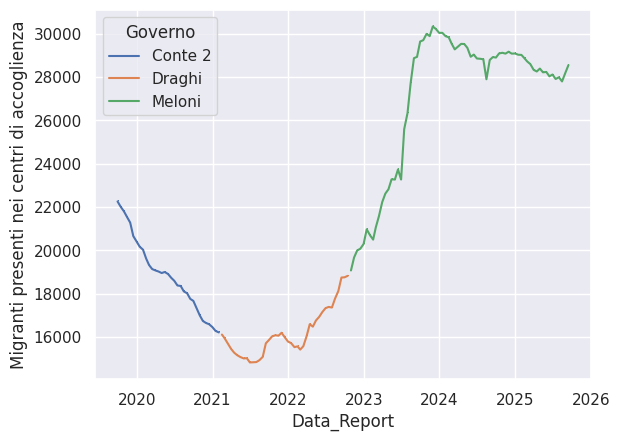

In [ ]:
sns.set_theme(style="darkgrid")

sns.lineplot(
    data=joined[joined['macroregion'] == 'Nord-ovest'],
    x='Data_Report',
    y='Migranti presenti nei centri di accoglienza',
    hue='Government',   # colore per i governi
    estimator='sum',
    errorbar=None,
    marker=','
)



NameError: name 'plt' is not defined

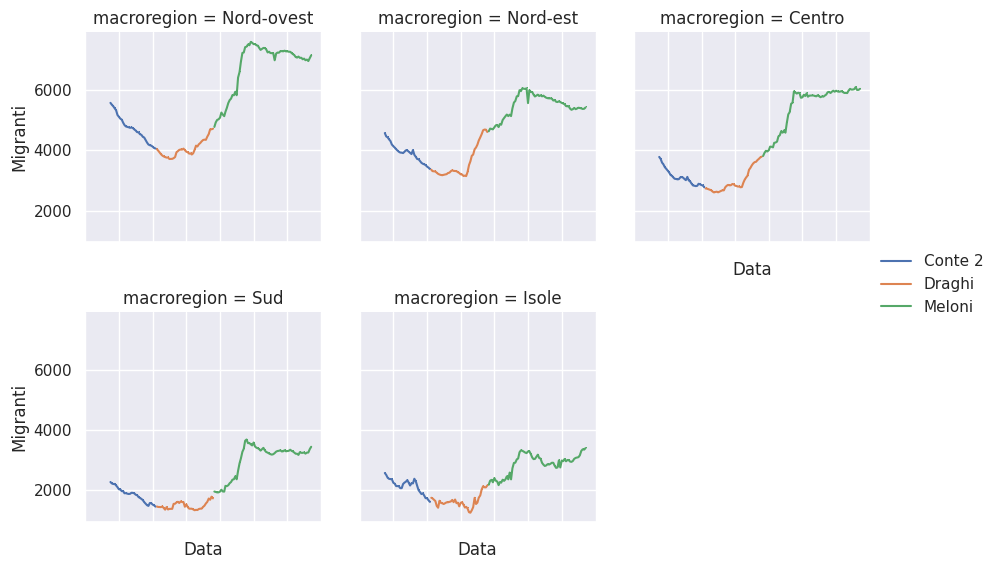

In [ ]:
g = sns.FacetGrid(
    joined,
    col='macroregion',
    col_wrap=3,     # 3 colonne per riga
    height=3,
    sharey=True
)

g.map_dataframe(
    sns.lineplot,
    x='Data_Report',
    y='Migranti presenti nei centri di accoglienza',
    hue='Government',
    marker=',',
    estimator='sum',
    errorbar=None
)

g.set_xticklabels(rotation=45)
g.set_axis_labels("", "Number of migrants")
g.add_legend()
plt.show()
